In [1]:
%load_ext lab_black

In [2]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, random_state=1
)

print(X_train.shape)
print(X_test.shape)

(426, 30)
(143, 30)


In [3]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [4]:
scaler.fit(X_train)

MinMaxScaler()

In [5]:
# transform data
X_train_scaled = scaler.transform(X_train)
# print dataset properties before and after scaling
print("transformed shape: {}".format(X_train_scaled.shape))
print("per-feature minimum before scaling:\n {}".format(X_train.min(axis=0)))
print("per-feature maximum before scaling:\n {}".format(X_train.max(axis=0)))
print("per-feature minimum after scaling:\n {}".format(X_train_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n {}".format(X_train_scaled.max(axis=0)))

transformed shape: (426, 30)
per-feature minimum before scaling:
 [6.981e+00 9.710e+00 4.379e+01 1.435e+02 5.263e-02 1.938e-02 0.000e+00
 0.000e+00 1.060e-01 5.024e-02 1.153e-01 3.602e-01 7.570e-01 6.802e+00
 1.713e-03 2.252e-03 0.000e+00 0.000e+00 9.539e-03 8.948e-04 7.930e+00
 1.202e+01 5.041e+01 1.852e+02 7.117e-02 2.729e-02 0.000e+00 0.000e+00
 1.566e-01 5.521e-02]
per-feature maximum before scaling:
 [2.811e+01 3.928e+01 1.885e+02 2.501e+03 1.634e-01 2.867e-01 4.268e-01
 2.012e-01 3.040e-01 9.575e-02 2.873e+00 4.885e+00 2.198e+01 5.422e+02
 3.113e-02 1.354e-01 3.960e-01 5.279e-02 6.146e-02 2.984e-02 3.604e+01
 4.954e+01 2.512e+02 4.254e+03 2.226e-01 9.379e-01 1.170e+00 2.910e-01
 5.774e-01 1.486e-01]
per-feature minimum after scaling:
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
per-feature maximum after scaling:
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


In [6]:
# transform test data
X_test_scaled = scaler.transform(X_test)
# print test data properties after scaling
print("per-feature minimum after scaling:\n {}".format(X_test_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n {}".format(X_test_scaled.max(axis=0)))

per-feature minimum after scaling:
 [ 0.0336031   0.0226581   0.03144219  0.01141039  0.14128374  0.04406704
  0.          0.          0.1540404  -0.00615249 -0.00137796  0.00594501
  0.00430665  0.00079567  0.03919502  0.0112206   0.          0.
 -0.03191387  0.00664013  0.02660975  0.05810235  0.02031974  0.00943767
  0.1094235   0.02637792  0.          0.         -0.00023764 -0.00182032]
per-feature maximum after scaling:
 [0.9578778  0.81501522 0.95577362 0.89353128 0.81132075 1.21958701
 0.87956888 0.9333996  0.93232323 1.0371347  0.42669616 0.49765736
 0.44117231 0.28371044 0.48703131 0.73863671 0.76717172 0.62928585
 1.33685792 0.39057253 0.89612238 0.79317697 0.84859804 0.74488793
 0.9154725  1.13188961 1.07008547 0.92371134 1.20532319 1.63068851]


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

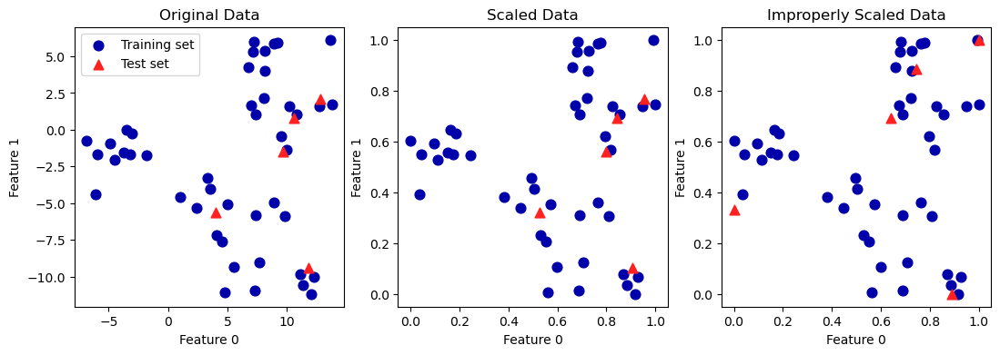

In [7]:
# import plotting libraries
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
import mglearn

# make synthetic data
X, _ = make_blobs(n_samples=50, centers=5, random_state=4, cluster_std=2)
X_train, X_test = train_test_split(X, random_state=5, test_size=0.1)

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].scatter(
    X_train[:, 0], X_train[:, 1], c=mglearn.cm2(0), label="Training set", s=60
)
axes[0].scatter(
    X_test[:, 0], X_test[:, 1], marker="^", c=mglearn.cm2(1), label="Test set", s=60
)
axes[0].legend(loc="upper left")
axes[0].set_title("Original Data")

# scale the data using MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# visualize the properly scaled data
axes[1].scatter(
    X_train_scaled[:, 0],
    X_train_scaled[:, 1],
    c=mglearn.cm2(0),
    label="Training set",
    s=60,
)
axes[1].scatter(
    X_test_scaled[:, 0],
    X_test_scaled[:, 1],
    marker="^",
    c=mglearn.cm2(1),
    label="Test set",
    s=60,
)
axes[1].set_title("Scaled Data")

# rescale the test set separately so test set for model is truly unknown
# DO NOT DO THIS! For illustration purposes only.
# pretend we do not have this information
test_scaler = MinMaxScaler()
test_scaler.fit(X_test)
X_test_scaled_badly = test_scaler.transform(X_test)

# visualize wrongly scaled data
axes[2].scatter(
    X_train_scaled[:, 0],
    X_train_scaled[:, 1],
    c=mglearn.cm2(0),
    label="training set",
    s=60,
)
axes[2].scatter(
    X_test_scaled_badly[:, 0],
    X_test_scaled_badly[:, 1],
    marker="^",
    c=mglearn.cm2(1),
    label="test set",
    s=60,
)
axes[2].set_title("Improperly Scaled Data")

for ax in axes:
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")

In [8]:
from sklearn.svm import SVC

X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, random_state=0
)

svm = SVC(C=100)
svm.fit(X_train, y_train)

print("Test set accuracy: {:.2f}".format(svm.score(X_test, y_test)))

Test set accuracy: 0.94


In [9]:
# preprocessing using 0-1 scaling
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learn an SVM on the scaled training data
svm.fit(X_train_scaled, y_train)

# scoring on the scaled test set
print("Scaled test set accuracy: {:.2f}".format(svm.score(X_test_scaled, y_test)))

Scaled test set accuracy: 0.97


In [10]:
# preprocessing using zero mean and unit variance scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

# transform data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learn an SVM on the scaled training data
svm.fit(X_train_scaled, y_train)

# scoring on the scaled test set
print("SVM test accuracy: {:.2f}".format(svm.score(X_test_scaled, y_test)))

SVM test accuracy: 0.96


((569, 30),
 (212, 30),
 (357, 30),
 array([0.05504  , 0.0580892, 0.0611384, 0.0641876, 0.0672368, 0.070286 ,
        0.0733352, 0.0763844, 0.0794336, 0.0824828, 0.085532 , 0.0885812,
        0.0916304, 0.0946796, 0.0977288, 0.100778 , 0.1038272, 0.1068764,
        0.1099256, 0.1129748, 0.116024 , 0.1190732, 0.1221224, 0.1251716,
        0.1282208, 0.13127  , 0.1343192, 0.1373684, 0.1404176, 0.1434668,
        0.146516 , 0.1495652, 0.1526144, 0.1556636, 0.1587128, 0.161762 ,
        0.1648112, 0.1678604, 0.1709096, 0.1739588, 0.177008 , 0.1800572,
        0.1831064, 0.1861556, 0.1892048, 0.192254 , 0.1953032, 0.1983524,
        0.2014016, 0.2044508, 0.2075   ]),
 array([ 5, 15, 19, 33, 51, 47, 50, 55, 53, 40, 28, 24, 28, 17, 16, 20, 15,
         8,  4,  4,  7,  5,  6,  4,  3,  2,  1,  2,  3,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1]))

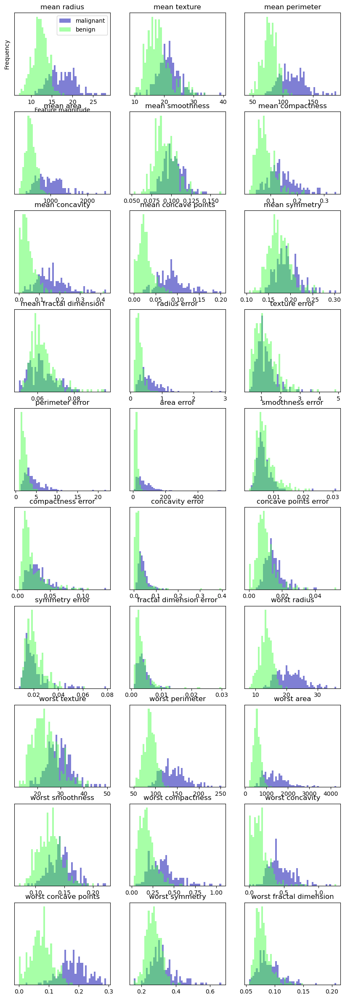

In [77]:
import numpy as np

fig, axes = plt.subplots(10, 3, figsize=(10, 30))
malignant = cancer.data[cancer.target == 0]
benign = cancer.data[cancer.target == 1]

ax = axes.ravel()

for i in range(30):
    _, bins = np.histogram(cancer.data[:, i], bins=50)
    ax[i].hist(malignant[:, i], bins=bins, color=mglearn.cm3(0), alpha=0.5)
    ax[i].hist(benign[:, i], bins=bins, color=mglearn.cm3(2), alpha=0.5)
    ax[i].set_title(cancer.feature_names[i])
    ax[i].set_yticks(())
ax[0].set_xlabel("Feature magnitude")
ax[0].set_ylabel("Frequency")
ax[0].legend(["malignant", "benign"], loc="best")
cancer.data.shape, malignant.shape, benign.shape, bins, _

In [12]:
scaler = StandardScaler()
scaler.fit(cancer.data)
X_scaled = scaler.transform(cancer.data)

In [13]:
from sklearn.decomposition import PCA

# keep the first two principal components of the data
pca = PCA(n_components=2)
# fit PCA model to breast cancer data
pca.fit(X_scaled)

# transform data onto the first two principal components
X_pca = pca.transform(X_scaled)
print("Original shape: {}".format(str(X_scaled.shape)))
print("Reduced shape: {}".format(str(X_pca.shape)))

Original shape: (569, 30)
Reduced shape: (569, 2)


Text(0, 0.5, 'Second principal component')

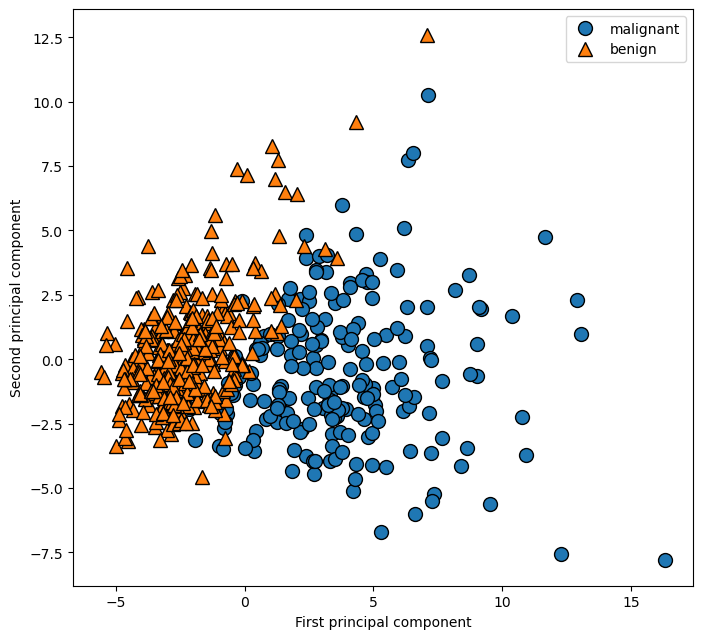

In [14]:
# plot first vs. second principal component, colored by class
plt.figure(figsize=(8, 8))
mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], cancer.target)
plt.legend(cancer.target_names, loc="best")
plt.gca().set_aspect("equal")
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

In [15]:
print("PCA component shape: {}".format(pca.components_.shape))

PCA component shape: (2, 30)


In [16]:
print("PCA components:\n{}".format(pca.components_))

PCA components:
[[ 0.21890244  0.10372458  0.22753729  0.22099499  0.14258969  0.23928535
   0.25840048  0.26085376  0.13816696  0.06436335  0.20597878  0.01742803
   0.21132592  0.20286964  0.01453145  0.17039345  0.15358979  0.1834174
   0.04249842  0.10256832  0.22799663  0.10446933  0.23663968  0.22487053
   0.12795256  0.21009588  0.22876753  0.25088597  0.12290456  0.13178394]
 [-0.23385713 -0.05970609 -0.21518136 -0.23107671  0.18611302  0.15189161
   0.06016536 -0.0347675   0.19034877  0.36657547 -0.10555215  0.08997968
  -0.08945723 -0.15229263  0.20443045  0.2327159   0.19720728  0.13032156
   0.183848    0.28009203 -0.21986638 -0.0454673  -0.19987843 -0.21935186
   0.17230435  0.14359317  0.09796411 -0.00825724  0.14188335  0.27533947]]


Text(0, 0.5, 'Principal components')

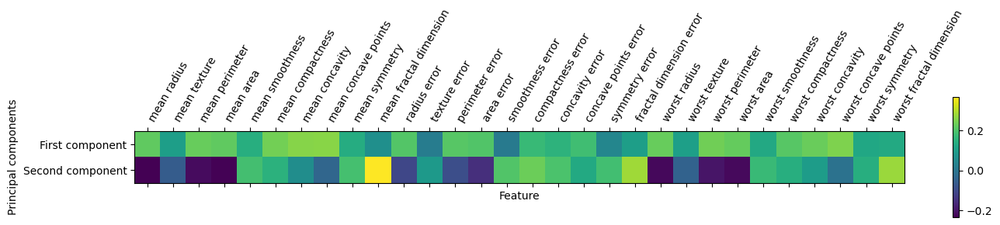

In [17]:
plt.matshow(pca.components_, cmap="viridis")
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(
    range(len(cancer.feature_names)), cancer.feature_names, rotation=60, ha="left"
)
plt.xlabel("Feature")
plt.ylabel("Principal components")

In [18]:
from sklearn.datasets import fetch_lfw_people

people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
image_shape = people.images[0].shape

# plot images of people
# fig, axes = plt.subplots(2, 5, figsize=(15, 8), subplot_kw={"xticks": (), "yticks": ()})
# for target, image, ax in zip(people.target, people.images, axes.ravel()):
#     ax.imshow(image)
#     ax.set_title(people.target_names[target])
people.target.min(), people.target.max(), len(
    people.target
), image_shape, people.images.shape

(0, 61, 3023, (87, 65), (3023, 87, 65))

In [19]:
print("people.images.shape: {}".format(people.images.shape))
print("Number of classes: {}".format(len(people.target_names)))

people.images.shape: (3023, 87, 65)
Number of classes: 62


In [20]:
# count how often each target appears
counts = np.bincount(people.target)
print(counts)
# print counts next to target names
for i, (count, name) in enumerate(zip(counts, people.target_names)):
    print("{0:25} {1:3}".format(name, count), end="   ")
    if (i + 1) % 3 == 0:
        print()

[ 39  35  21  36  20  77  42  24  29  21 236  31 121  22 530 109  44  26
  30  22  39  71  20  28  52  55  21  42  21  24  20  53  31  23  28  60
  32  41  22  41  48  29  33  20  22  37  20  22  30  27  32  26  23  52
  33  23  25  33 144  32  49  24]
Alejandro Toledo           39   Alvaro Uribe               35   Amelie Mauresmo            21   
Andre Agassi               36   Angelina Jolie             20   Ariel Sharon               77   
Arnold Schwarzenegger      42   Atal Bihari Vajpayee       24   Bill Clinton               29   
Carlos Menem               21   Colin Powell              236   David Beckham              31   
Donald Rumsfeld           121   George Robertson           22   George W Bush             530   
Gerhard Schroeder         109   Gloria Macapagal Arroyo    44   Gray Davis                 26   
Guillermo Coria            30   Hamid Karzai               22   Hans Blix                  39   
Hugo Chavez                71   Igor Ivanov                20   Jack

In [21]:
mask = np.zeros(people.target.shape, dtype=bool)

# np.where(people.target == target)[0][:50]] = 1
for target in np.unique(people.target):
    mask[np.where(people.target == target)[0][:50]] = 1

X_people = people.data[mask]
y_people = people.target[mask]

# scale the grayscale values to be between 0 and 1
# instead of 0 and 255 for better numeric stability
X_people = X_people / 255.0

In [22]:
from sklearn.neighbors import KNeighborsClassifier

print(X_people.shape, y_people.shape)
# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0
)

# build a KNeighborsClassifier using one neighbor
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
print("Test set score of 1-nn: {:.2f}".format(knn.score(X_test, y_test)))

(2063, 5655) (2063,)
Test set score of 1-nn: 0.14


In [23]:
pca = PCA(n_components=100, whiten=True, random_state=0).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print("X_train_pca.shape: {}".format(X_train_pca.shape))

X_train_pca.shape: (1547, 100)


In [24]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train_pca, y_train)
print("Test set accuracy: {:.2f}".format(knn.score(X_test_pca, y_test)))

Test set accuracy: 0.15


In [25]:
print("pca.components_.shape: {}".format(pca.components_.shape))

pca.components_.shape: (100, 5655)


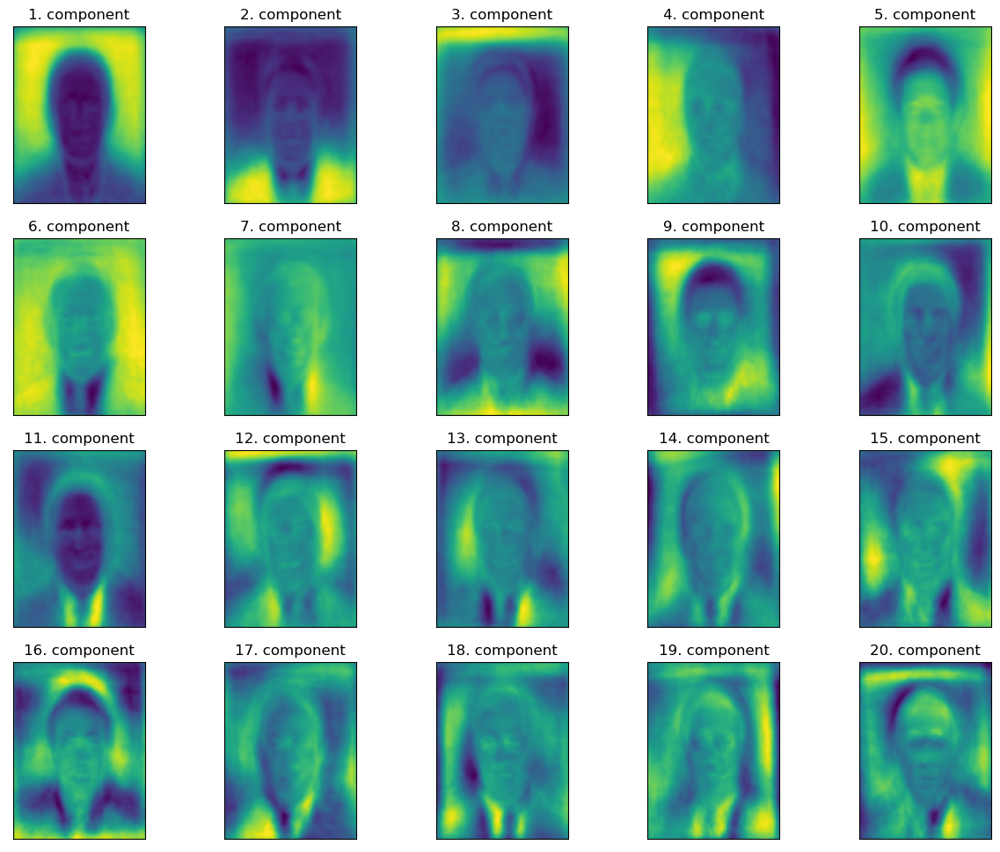

In [26]:
fix, axes = plt.subplots(
    4, 5, figsize=(15, 12), subplot_kw={"xticks": (), "yticks": ()}
)
for i, (component, ax) in enumerate(zip(pca.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape), cmap="viridis")
    ax.set_title("{}. component".format((i + 1)))

/opt/homebrew/anaconda3/envs/sklearn-env/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


(1547, 10)
(516, 10)


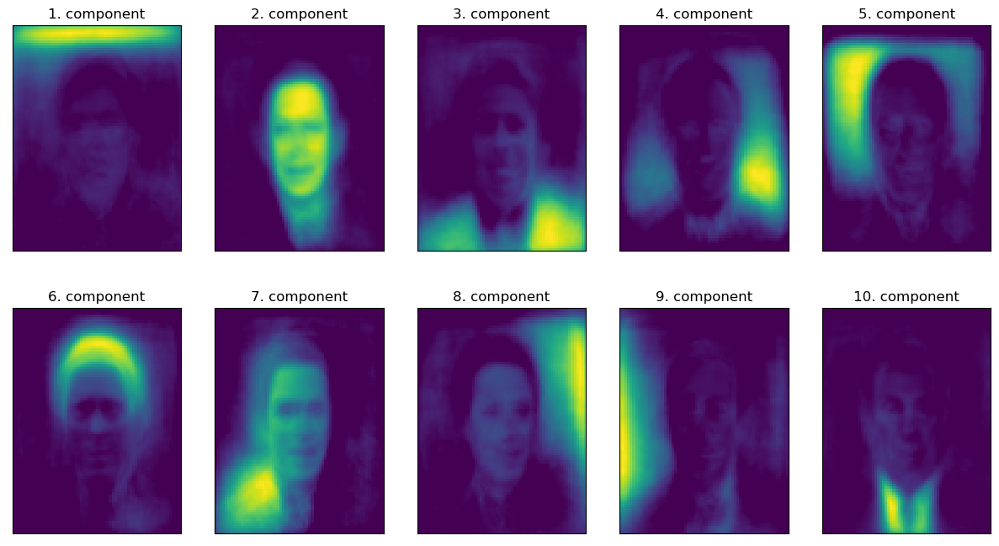

In [27]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=10, random_state=0)
nmf.fit(X_train)
X_train_nmf = nmf.transform(X_train)
X_test_nmf = nmf.transform(X_test)
print(X_train_nmf.shape), print(X_test_nmf.shape)

fix, axes = plt.subplots(2, 5, figsize=(15, 8), subplot_kw={"xticks": (), "yticks": ()})
for i, (component, ax) in enumerate(zip(nmf.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape), cmap="viridis")
    ax.set_title("{}. component".format((i + 1)))

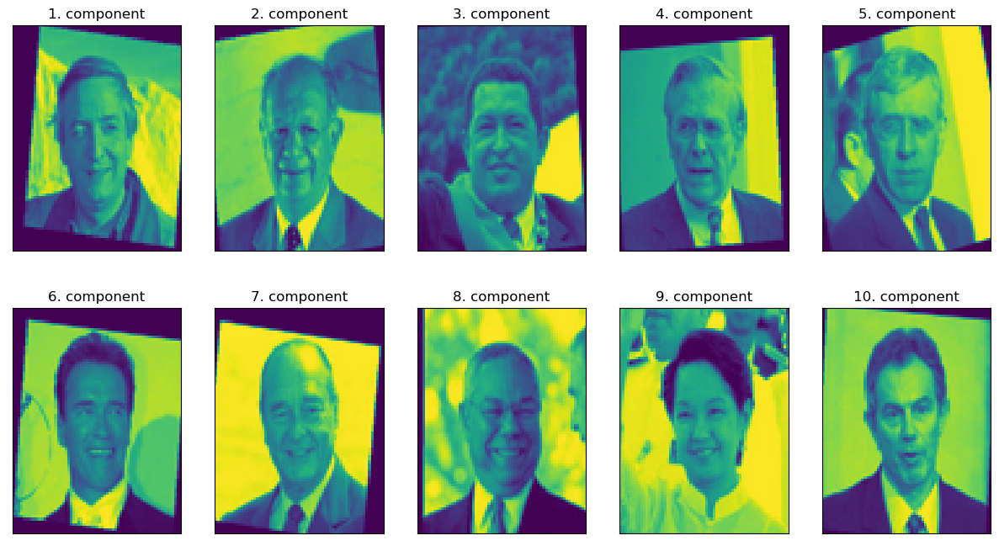

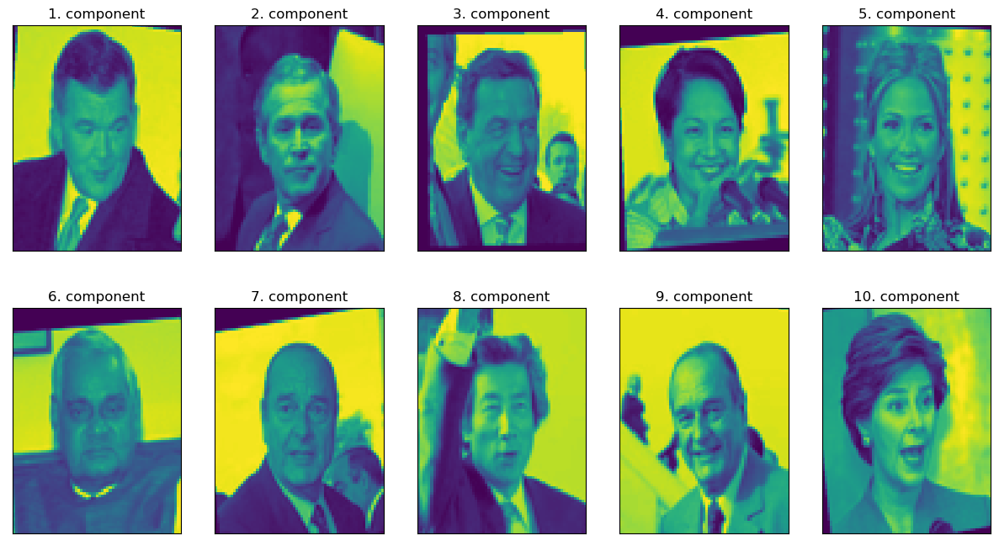

In [28]:
compn = 3
# sort by 3rd component
inds = np.argsort(X_train_nmf[:, compn])[::-1]
# plot images largest 3rd component values
fix, axes = plt.subplots(2, 5, figsize=(15, 8), subplot_kw={"xticks": (), "yticks": ()})
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))
    ax.set_title("{}. component".format((i + 1)))

compn = 7
# sort by 7th component
inds = np.argsort(X_train_nmf[:, compn])[::-1]
# plot images largest 7th component values
fix, axes = plt.subplots(2, 5, figsize=(15, 8), subplot_kw={"xticks": (), "yticks": ()})
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))
    ax.set_title("{}. component".format((i + 1)))

((2000, 3), (3,))

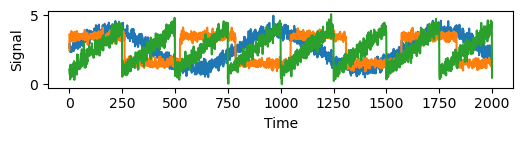

In [29]:
S = mglearn.datasets.make_signals()
plt.figure(figsize=(6, 1))
plt.plot(S, "-")
plt.xlabel("Time")
plt.ylabel("Signal")
S.shape, S[0].shape

In [30]:
# mix data into a 100-dimensional state
A = np.random.RandomState(0).uniform(size=(100, 3))
X = np.dot(S, A.T)
print("Shape of measurements: {}".format(X.shape))

Shape of measurements: (2000, 100)


In [31]:
a = np.ones([9, 5, 7, 4])
c = np.ones([9, 5, 4, 3])
np.dot(a, c).shape
np.matmul(a, c).shape

(9, 5, 7, 3)

In [32]:
nmf = NMF(n_components=3, random_state=42)
S_ = nmf.fit_transform(X)
print("Recovered signal shape: {}".format(S_.shape))

Recovered signal shape: (2000, 3)


In [33]:
pca = PCA(n_components=3)
H = pca.fit_transform(X)

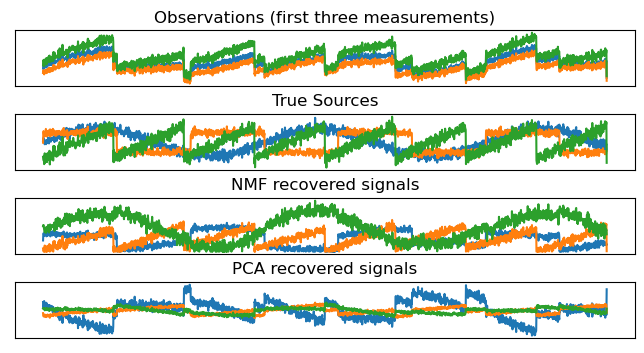

In [34]:
models = [X, S, S_, H]
names = [
    "Observations (first three measurements)",
    "True Sources",
    "NMF recovered signals",
    "PCA recovered signals",
]
fig, axes = plt.subplots(
    4,
    figsize=(8, 4),
    gridspec_kw={"hspace": 0.5},
    subplot_kw={"xticks": (), "yticks": ()},
)
for model, name, ax in zip(models, names, axes):
    ax.set_title(name)
    ax.plot(model[:, :3], "-")

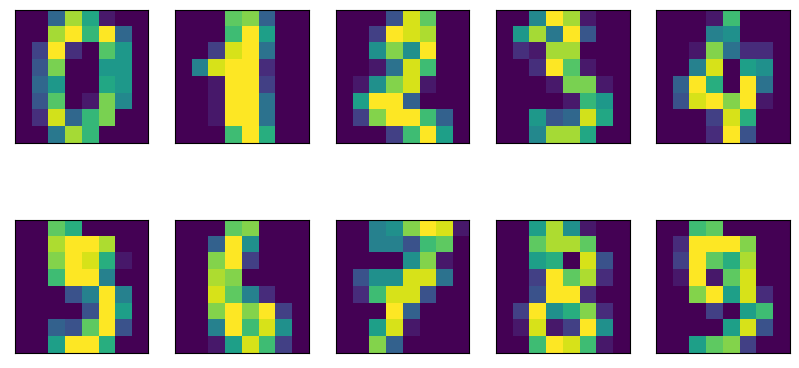

In [35]:
from sklearn.datasets import load_digits

digits = load_digits()

fig, axes = plt.subplots(2, 5, figsize=(10, 5), subplot_kw={"xticks": (), "yticks": ()})
for ax, img in zip(axes.ravel(), digits.images):
    ax.imshow(img)

Text(0, 0.5, 'Second principal component')

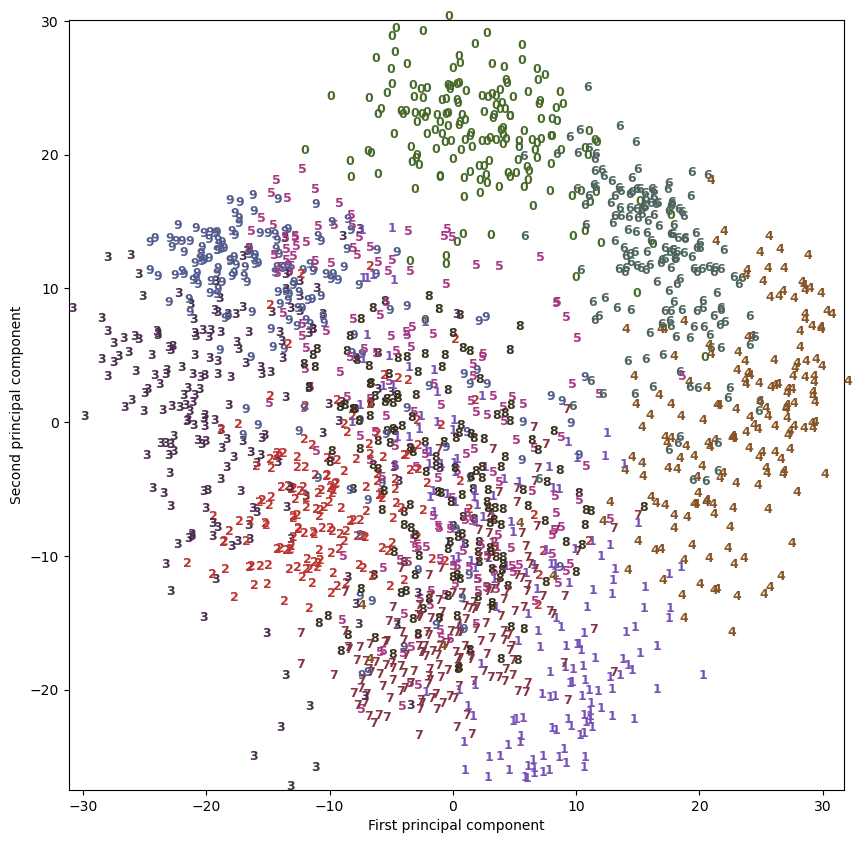

In [36]:
# build a PCA model
pca = PCA(n_components=2)
# fit PCA model to digits
pca.fit(digits.data)
# transform the digits data onto the first two principal components
digits_pca = pca.transform(digits.data)
colors = [
    "#476A2A",
    "#7851B8",
    "#BD3430",
    "#4A2D4E",
    "#875525",
    "#A83683",
    "#4E655E",
    "#853541",
    "#3A3120",
    "#535D8E",
]
plt.figure(figsize=(10, 10))
plt.xlim(digits_pca[:, 0].min(), digits_pca[:, 0].max())
plt.ylim(digits_pca[:, 1].min(), digits_pca[:, 1].max())
for i in range(len(digits.data)):
    # actually plot the digits as text instead of using scatter
    plt.text(
        digits_pca[i, 0],
        digits_pca[i, 1],
        str(digits.target[i]),
        color=colors[digits.target[i]],
        fontdict={"weight": "bold", "size": 9},
    )
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

In [37]:
# load TSNE
from sklearn.manifold import TSNE

# build a TSNE model
tsne = TSNE(random_state=42)
# fit TSNE model to digits
digits_tsne = tsne.fit_transform(digits.data)

/opt/homebrew/anaconda3/envs/sklearn-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/anaconda3/envs/sklearn-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Text(0, 0.5, 'Second principal component')

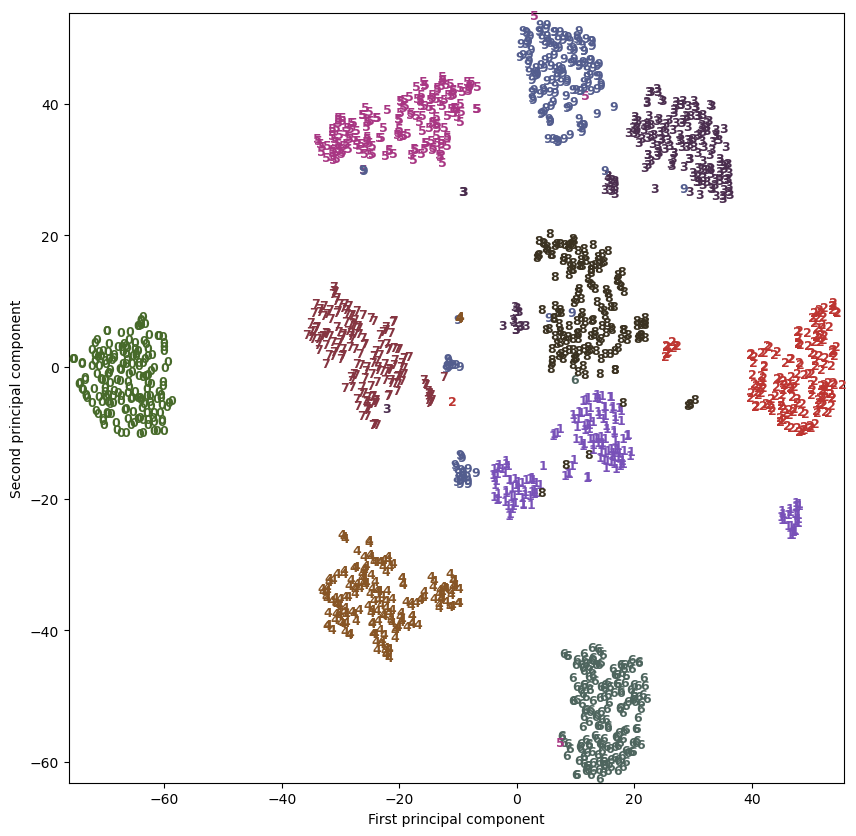

In [38]:
plt.figure(figsize=(10, 10))
plt.xlim(digits_tsne[:, 0].min(), digits_tsne[:, 0].max() + 1)
plt.ylim(digits_tsne[:, 1].min(), digits_tsne[:, 1].max() + 1)
for i in range(len(digits_tsne)):
    plt.text(
        digits_tsne[i, 0],
        digits_tsne[i, 1],
        str(digits.target[i]),
        color=colors[digits.target[i]],
        fontdict={"weight": "bold", "size": 9},
    )
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

In [39]:
from sklearn.cluster import KMeans

X, y = make_blobs(random_state=1)
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
X.shape

(100, 2)

In [40]:
print("Cluster memberships:\n{}".format(kmeans.labels_))

Cluster memberships:
[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


In [41]:
print(kmeans.predict(X))

[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


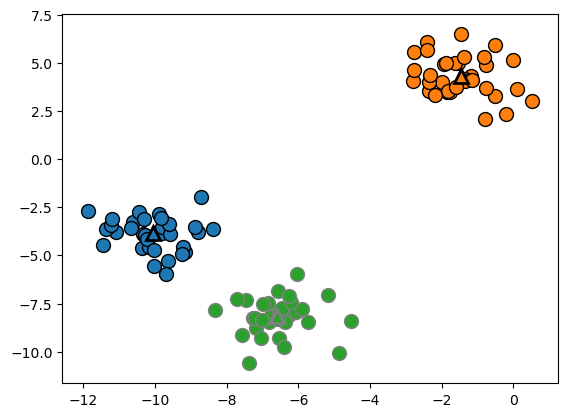

In [42]:
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers="o")
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    [0, 1, 2],
    markers="^",
    markeredgewidth=2,
)

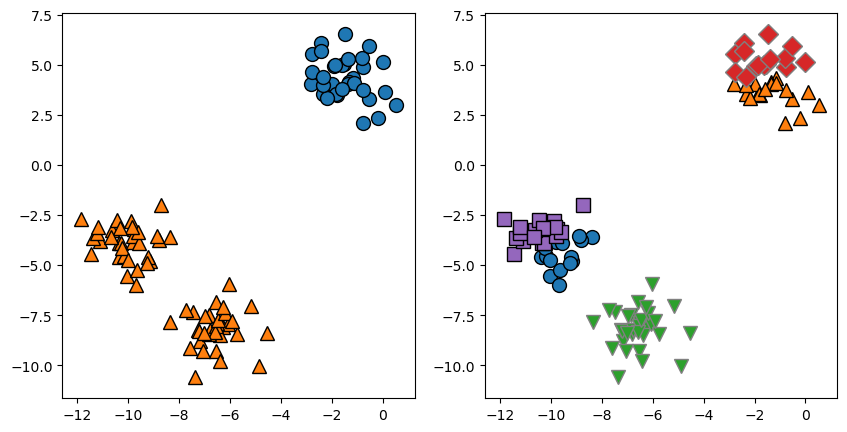

In [43]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# using two cluster centers:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
assignments = kmeans.labels_
mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[0])

# using five cluster centers:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
assignments = kmeans.labels_
mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[1])

Text(0, 0.5, 'Feature 1')

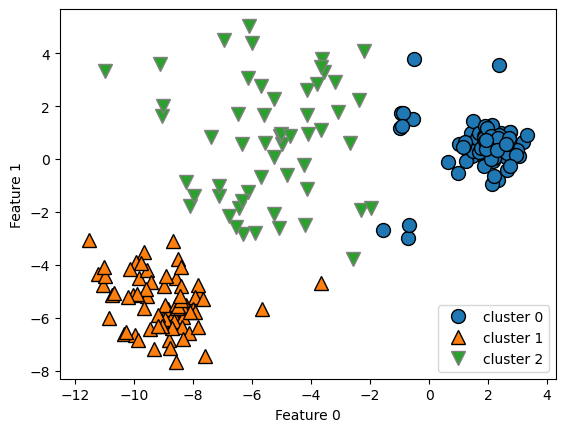

In [44]:
X_varied, y_varied = make_blobs(
    n_samples=200, cluster_std=[1.0, 2.5, 0.5], random_state=170
)
y_pred = KMeans(n_clusters=3, random_state=0).fit_predict(X_varied)

mglearn.discrete_scatter(X_varied[:, 0], X_varied[:, 1], y_pred)
plt.legend(["cluster 0", "cluster 1", "cluster 2"], loc="best")
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0, 0.5, 'Feature 1')

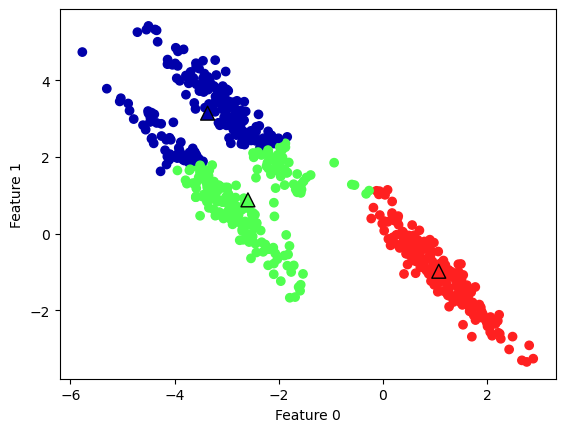

In [45]:
# generate some random clusters
X, y = make_blobs(random_state=170, n_samples=600)
rng = np.random.RandomState(74)
# transform the data to be stretched
transformation = rng.normal(size=(2, 2))
X = np.dot(X, transformation)

# cluster the data into three clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignments and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm3)
plt.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    marker="^",
    c=[0, 1, 2],
    s=100,
    linewidth=1,
    cmap=mglearn.cm3,
    edgecolors="k",
)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

[0.04134667 0.         0.08269334 0.20673334 0.37212002 0.24808001
 0.49616002 1.03366671 1.48848007 1.77790675 2.27406677 2.97696014
 3.14234681 3.84524018 4.25870686 3.96928018 3.51446683 3.05965348
 2.35676011 1.98464009 1.4471334  1.19905339 0.62020003 0.45481335
 0.16538667 0.12404001 0.         0.12404001 0.04134667 0.04134667] [-0.35433983 -0.33015408 -0.30596834 -0.28178259 -0.25759684 -0.2334111
 -0.20922535 -0.18503961 -0.16085386 -0.13666812 -0.11248237 -0.08829663
 -0.06411088 -0.03992514 -0.01573939  0.00844636  0.0326321   0.05681785
  0.08100359  0.10518934  0.12937508  0.15356083  0.17774657  0.20193232
  0.22611806  0.25030381  0.27448955  0.2986753   0.32286105  0.34704679
  0.37123254] <BarContainer object of 30 artists>


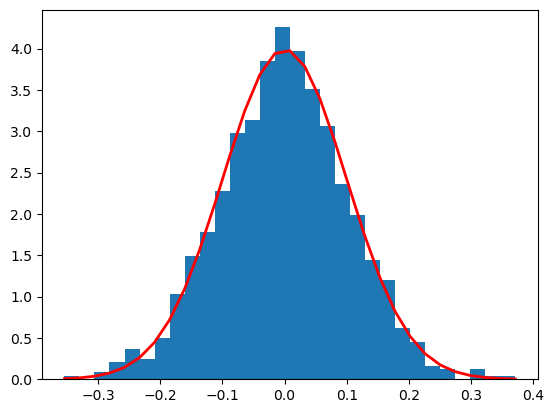

In [46]:
mu, sigma = 0, 0.1
s = np.random.normal(mu, sigma, 1000)

# count, bins, ignored = plt.hist(s, 30)
density, bins, ignored = plt.hist(s, 30, density=True)
print(density, bins, ignored)
plt.plot(
    bins,
    1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-((bins - mu) ** 2) / (2 * sigma**2)),
    linewidth=2,
    color="r",
)
plt.show()

In [47]:
x = np.array([1, 2, 4, 7, 0]) * np.array([1, 2, 4, 7, 0])
x

array([ 1,  4, 16, 49,  0])

Text(0, 0.5, 'Feature 1')

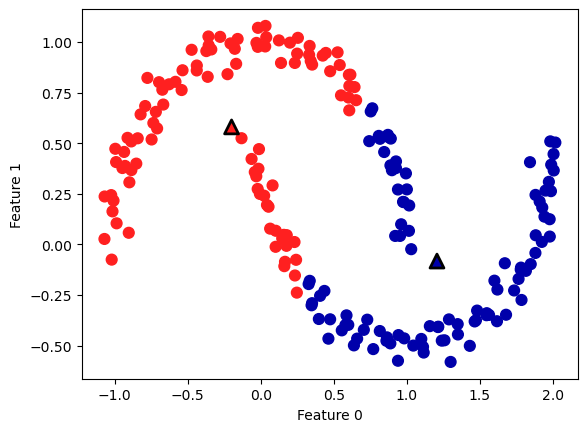

In [48]:
# generate synthetic two_mooons data (with less noise this time)
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# cluster the data into two clusters
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignments and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm2, s=60)
plt.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    marker="^",
    c=[mglearn.cm2(0), mglearn.cm2(1)],
    s=100,
    linewidth=2,
    edgecolors="k",
)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

In [49]:
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0
)
nmf = NMF(n_components=10, random_state=0)
nmf.fit(X_train)
pca = PCA(n_components=10, random_state=0)
pca.fit(X_train)
kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X_train)

X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test))
X_reconstructed_nmf = np.dot(nmf.transform(X_test), nmf.components_)
X_reconstructed_kmeans = kmeans.cluster_centers_[kmeans.predict(X_test)]

/opt/homebrew/anaconda3/envs/sklearn-env/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


(516, 5655) (516, 5655) (516, 5655) (516, 5655) (10, 5655) (10, 5655) (10, 5655)


Text(0, 0.5, 'nmf')

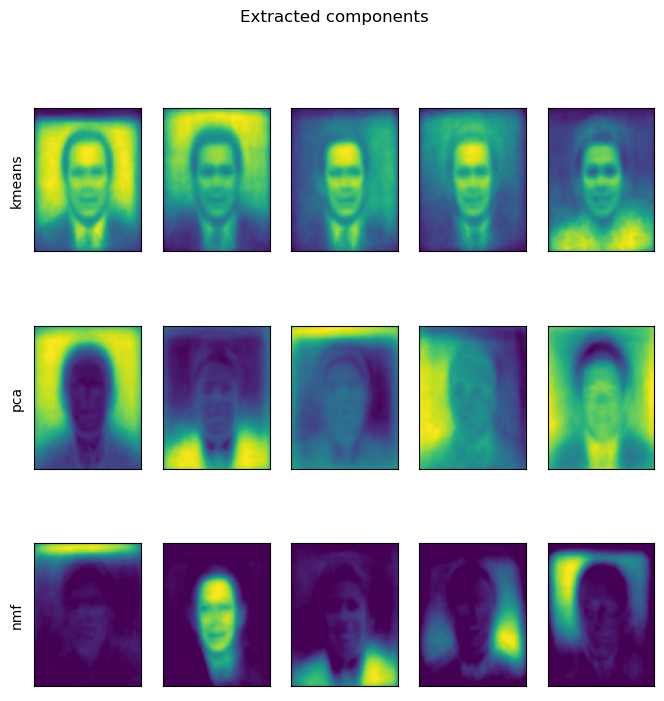

In [50]:
print(
    X_reconstructed_pca.shape,
    X_reconstructed_nmf.shape,
    X_reconstructed_kmeans.shape,
    X_test.shape,
    kmeans.cluster_centers_.shape,
    pca.components_.shape,
    nmf.components_.shape,
)
fig, axes = plt.subplots(3, 5, figsize=(8, 8), subplot_kw={"xticks": (), "yticks": ()})
fig.suptitle("Extracted components")
for ax, comp_kmeans, comp_pca, comp_nmf in zip(
    axes.T, kmeans.cluster_centers_, pca.components_, nmf.components_
):
    ax[0].imshow(comp_kmeans.reshape(image_shape))
    ax[1].imshow(comp_pca.reshape(image_shape), cmap="viridis")
    ax[2].imshow(comp_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("kmeans")
axes[1, 0].set_ylabel("pca")
axes[2, 0].set_ylabel("nmf")

Text(0, 0.5, 'nmf')

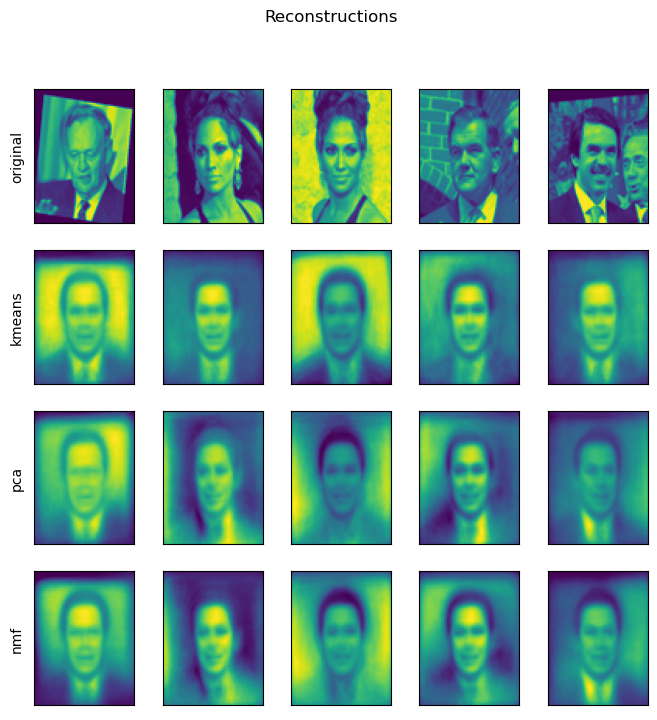

In [51]:
fig, axes = plt.subplots(4, 5, figsize=(8, 8), subplot_kw={"xticks": (), "yticks": ()})
fig.suptitle("Reconstructions")
for ax, orig, rec_kmeans, rec_pca, rec_nmf in zip(
    axes.T,
    X_test,
    X_reconstructed_kmeans,
    X_reconstructed_pca,
    X_reconstructed_nmf,
):
    ax[0].imshow(orig.reshape(image_shape))
    ax[1].imshow(rec_kmeans.reshape(image_shape))
    ax[2].imshow(rec_pca.reshape(image_shape))
    ax[3].imshow(rec_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("original")
axes[1, 0].set_ylabel("kmeans")
axes[2, 0].set_ylabel("pca")
axes[3, 0].set_ylabel("nmf")

Cluster memberships:
[9 2 5 4 2 7 9 6 9 6 1 0 2 6 1 9 3 0 3 1 7 6 8 6 8 5 2 7 5 8 9 8 6 5 3 7 0
 9 4 5 0 1 3 5 2 8 9 1 5 6 1 0 7 4 6 3 3 6 3 8 0 4 2 9 6 4 8 2 8 4 0 4 0 5
 6 4 5 9 3 0 7 8 0 7 5 8 9 8 0 7 3 9 7 1 7 2 2 0 4 5 6 7 8 9 4 5 4 1 2 3 1
 8 8 4 9 2 3 7 0 9 9 1 5 8 5 1 9 5 6 7 9 1 4 0 6 2 6 4 7 9 5 5 3 8 1 9 5 6
 3 5 0 2 9 3 0 8 6 0 3 3 5 6 3 2 0 2 3 0 2 6 3 4 4 1 5 6 7 1 1 3 2 4 7 2 7
 3 8 6 4 1 4 3 9 9 5 1 7 5 8 2]


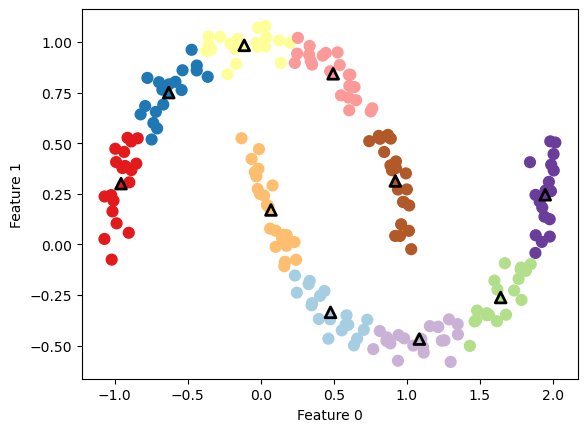

In [52]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
y_pred = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap="Paired", s=60)
plt.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    s=60,
    marker="^",
    c=range(kmeans.n_clusters),
    linewidth=2,
    cmap="Paired",
    edgecolors="k",
)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
print("Cluster memberships:\n{}".format(y_pred))

Text(0, 0.5, 'Feature 1')

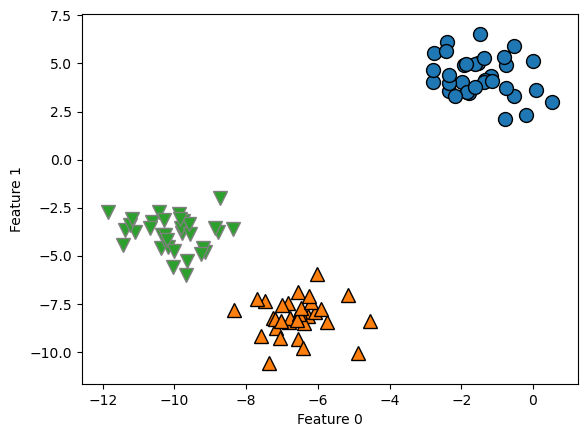

In [53]:
from sklearn.cluster import AgglomerativeClustering

X, y = make_blobs(random_state=1)

agg = AgglomerativeClustering(n_clusters=3)
assignment = agg.fit_predict(X)

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignment)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0, 0.5, 'Cluster distance')

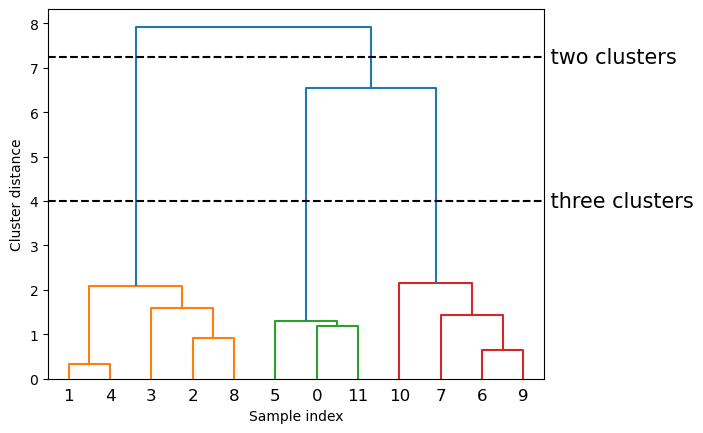

In [54]:
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_blobs(random_state=0, n_samples=12)

# Apply the ward clustering to the data array X
# The SciPy ward function returns an array that specifies the distances
# bridged when performing agglomerative clustering
linkage_array = ward(X)

# Now we plot the dendrogram for the linkage_array containing the distances
# between clusters
dendrogram(linkage_array)

# Mark the cuts in the tree that signify two or three clusters
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], "--", c="k")
ax.plot(bounds, [4, 4], "--", c="k")

ax.text(bounds[1], 7.25, " two clusters", va="center", fontdict={"size": 15})
ax.text(bounds[1], 4, " three clusters", va="center", fontdict={"size": 15})
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

In [55]:
from sklearn.cluster import DBSCAN

X, y = make_blobs(random_state=0, n_samples=12)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X)
print("Cluster memberships:\n{}".format(clusters))

Cluster memberships:
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


(200,) 0 1


Text(0.5, 0, 'Feature 0')

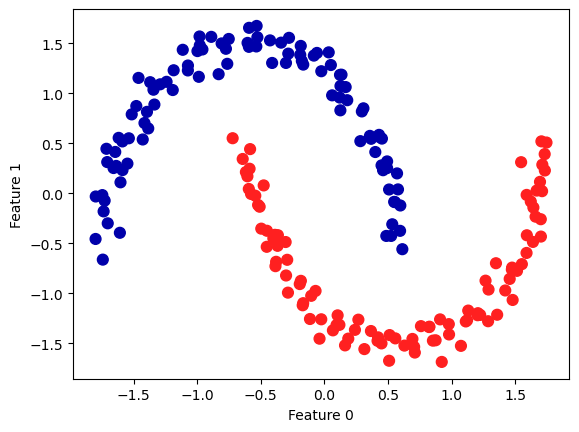

In [56]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X_scaled)
print(clusters.shape, clusters.min(), clusters.max())
# plot the cluster assignments
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm2, s=60)
plt.ylabel("Feature 1")
plt.xlabel("Feature 0")

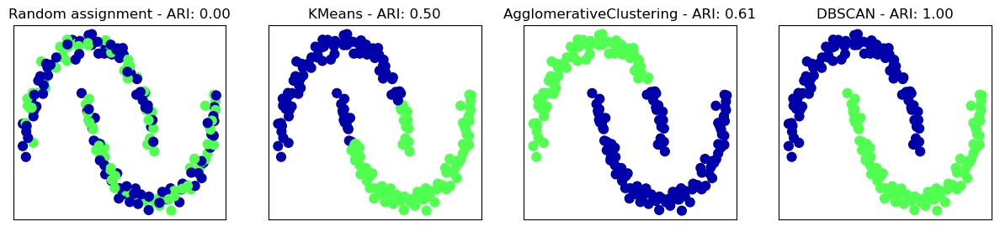

In [57]:
from sklearn.metrics.cluster import adjusted_rand_score

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3), subplot_kw={"xticks": (), "yticks": ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN()]

random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(
    X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap=mglearn.cm3, s=60
)
axes[0].set_title(
    "Random assignment - ARI: {:.2f}".format(adjusted_rand_score(y, random_clusters))
)

for ax, algorithm in zip(axes[1:], algorithms):
    # plot the cluster assignments and cluster centers
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3, s=60)
    ax.set_title(
        "{} - ARI: {:.2f}".format(
            algorithm.__class__.__name__, adjusted_rand_score(y, clusters)
        )
    )

In [58]:
from sklearn.metrics import accuracy_score

# these two labelings of the digits correspond to the same clustering
clusters1 = [0, 0, 1, 1, 0]
clusters2 = [1, 1, 0, 0, 1]
# accuracy is zero, as none of the labels are the same
print("Accuracy score: {:.2f}".format(accuracy_score(clusters1, clusters2)))
# adjusted rand score is 1, as the clustering is identical
print("ARI score: {:.2f}".format(adjusted_rand_score(clusters1, clusters2)))

Accuracy score: 0.00
ARI score: 1.00


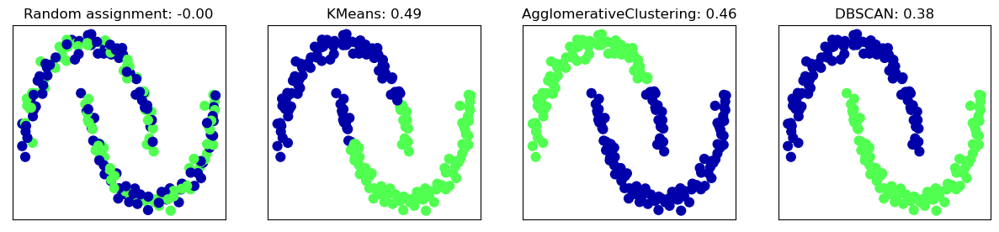

In [59]:
from sklearn.metrics.cluster import silhouette_score

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)
# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3), subplot_kw={"xticks": (), "yticks": ()})

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(
    X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap=mglearn.cm3, s=60
)
axes[0].set_title(
    "Random assignment: {:.2f}".format(silhouette_score(X_scaled, random_clusters))
)

algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN()]

for ax, algorithm in zip(axes[1:], algorithms):
    clusters = algorithm.fit_predict(X_scaled)
    # plot the cluster assignments and cluster centers
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3, s=60)
    ax.set_title(
        "{}: {:.2f}".format(
            algorithm.__class__.__name__, silhouette_score(X_scaled, clusters)
        )
    )

In [60]:
pca = PCA(n_components=100, whiten=True, random_state=0)
pca.fit_transform(X_people)
X_pca = pca.transform(X_people)
X_pca.shape

(2063, 100)

In [61]:
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))
labels.shape
# -1 means all of the data was labeled as “noise”

Unique labels: [-1]


(2063,)

In [62]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


In [63]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))
labels

Unique labels: [-1  0]


array([0, 0, 0, ..., 0, 0, 0])

In [64]:
print("Number of people in each cluster: {}".format(np.bincount(labels + 1)))
# 12 noise points, 1 cluster

Number of people in each cluster: [  12 2051]


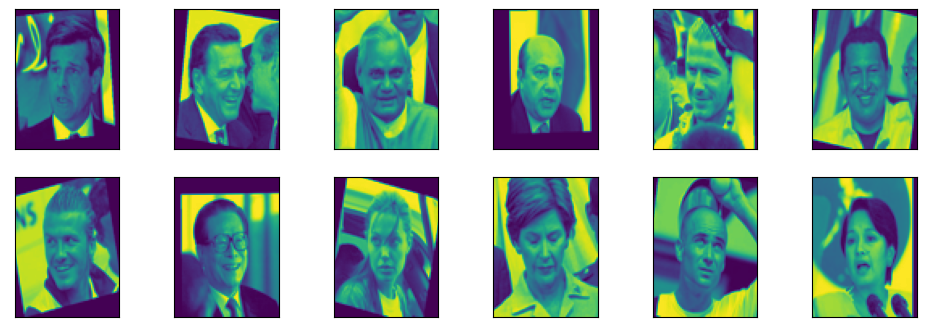

In [65]:
noise = X_people[labels == -1]
fig, axes = plt.subplots(2, 6, figsize=(12, 4), subplot_kw={"xticks": (), "yticks": ()})
for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape))

In [66]:
for eps in range(1, 7):
    print("\neps =", eps)
    dbscan = DBSCAN(min_samples=3, eps=eps)
    labels = dbscan.fit_predict(X_pca)
    print("Clusters present:", np.unique(labels))
    print("Cluster sizes:", np.bincount(labels + 1))


eps = 1
Clusters present: [-1]
Cluster sizes: [2063]

eps = 2
Clusters present: [-1]
Cluster sizes: [2063]

eps = 3
Clusters present: [-1]
Cluster sizes: [2063]

eps = 4
Clusters present: [-1]
Cluster sizes: [2063]

eps = 5
Clusters present: [-1  0]
Cluster sizes: [2060    3]

eps = 6
Clusters present: [-1  0  1]
Cluster sizes: [2038   20    5]


20
5


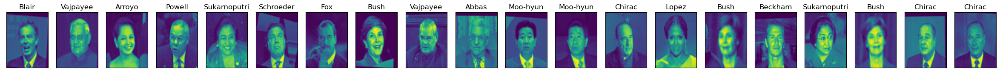

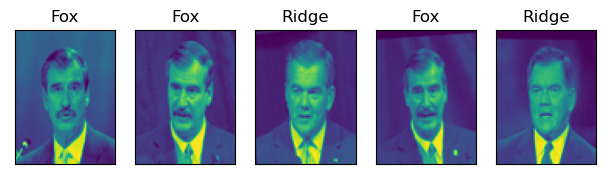

In [67]:
dbscan = DBSCAN(min_samples=3, eps=6)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images = np.sum(mask)
    print(n_images)
    fig, axes = plt.subplots(
        1,
        n_images,
        figsize=(n_images * 1.5, 4),
        subplot_kw={"xticks": (), "yticks": ()},
    )
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1])

In [68]:
# extract clusters with k-means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means:", np.bincount(labels_km))

Cluster sizes k-means: [ 94  91 270 222 119 331 119 220 495 102]


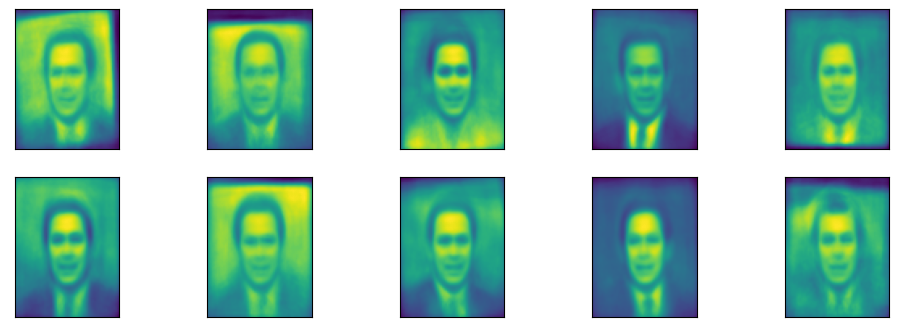

In [69]:
fig, axes = plt.subplots(2, 5, subplot_kw={"xticks": (), "yticks": ()}, figsize=(12, 4))
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape))
# As we clustered in the representation produced by PCA, we need to
# rotate the cluster centers back into the original space to visualize them, using
# pca.inverse_transform:

In [70]:
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("Cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

Cluster sizes agglomerative clustering: [185 975 298  96 103  28  60  22 203  93]


(2063, 100)
(2062, 4)


Text(0, 0.5, 'Cluster distance')

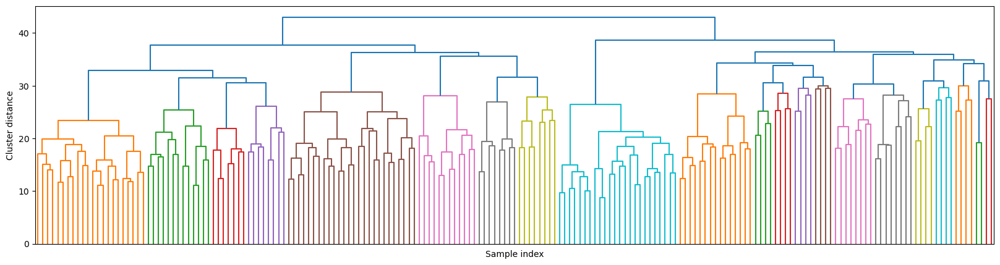

In [71]:
linkage_array = ward(X_pca)
print(X_pca.shape)
print(linkage_array.shape)
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode="level", no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

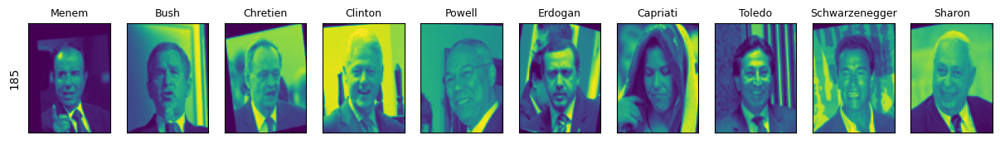

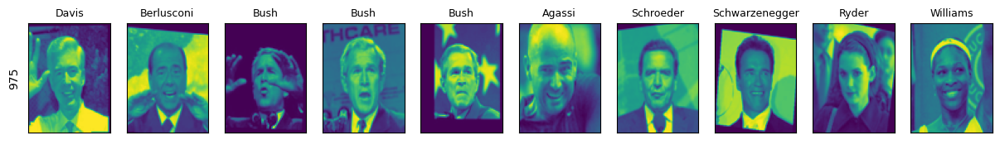

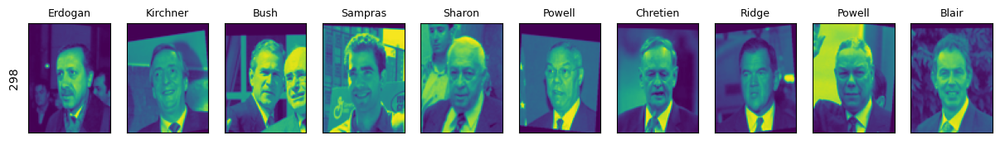

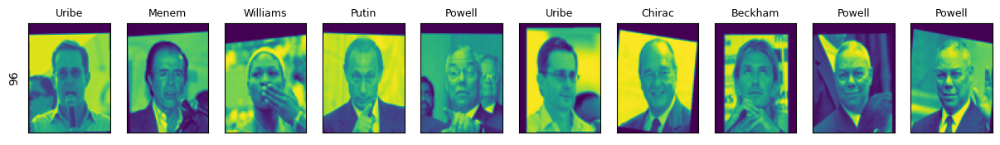

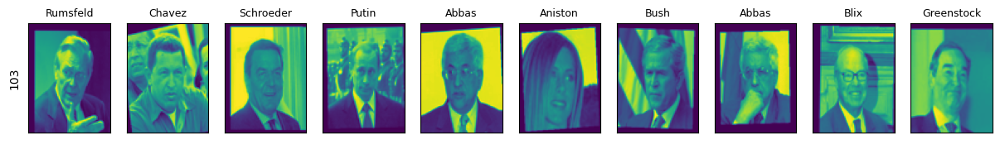

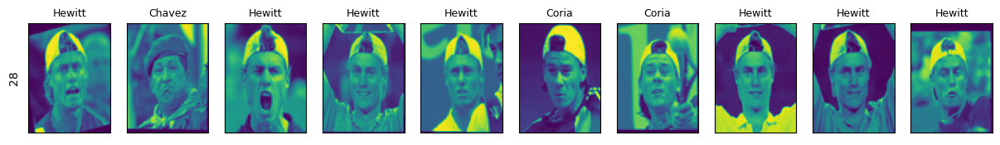

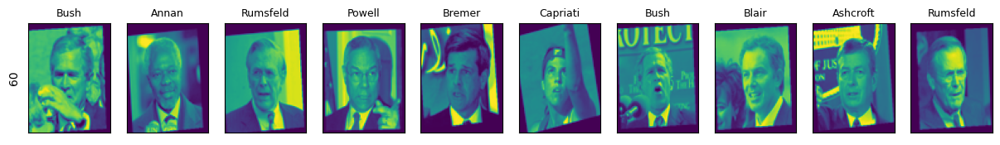

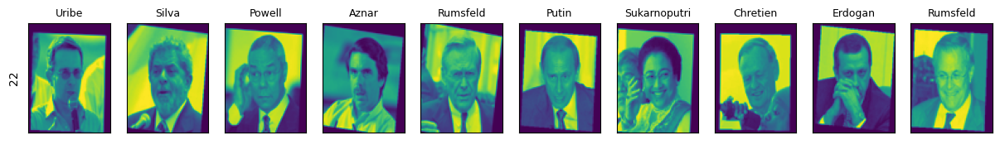

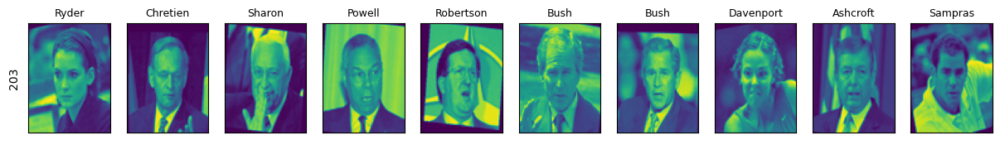

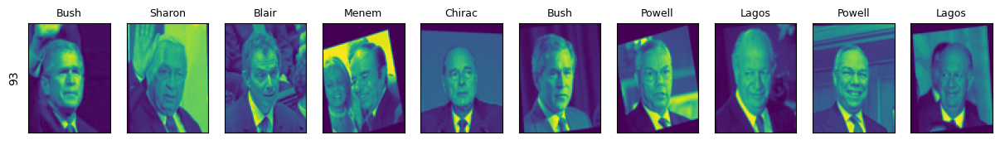

In [72]:
n_clusters = 10
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(
        1, 10, subplot_kw={"xticks": (), "yticks": ()}, figsize=(15, 8)
    )
    axes[0].set_ylabel(np.sum(mask))
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1], fontdict={"fontsize": 9})

Cluster sizes agglomerative clustering: [ 45 183  41  89 162  28  22  31  54 216  28  97 156  35  36  32  62  30
  42  16  55  29  33  63  16  31  18  31  64  60  30  29   6  36   7  27
  47  22  43  11]


/var/folders/gq/x0p5x61x59b0l02wwlvcqk_h0000gn/T/ipykernel_2421/372372397.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


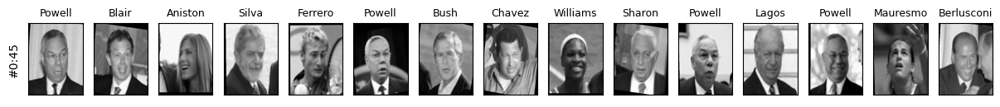

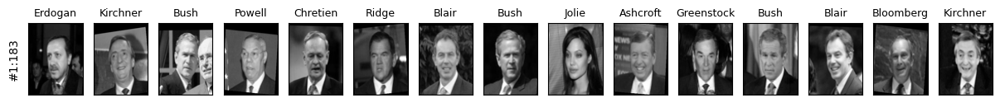

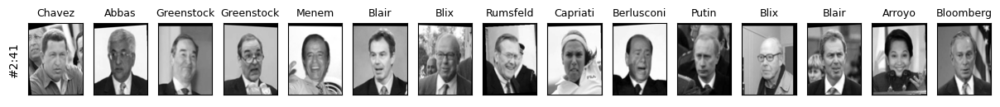

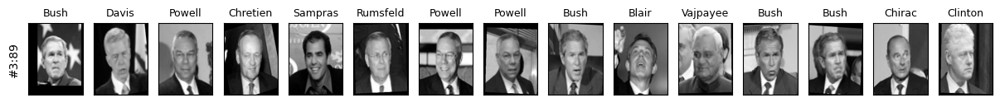

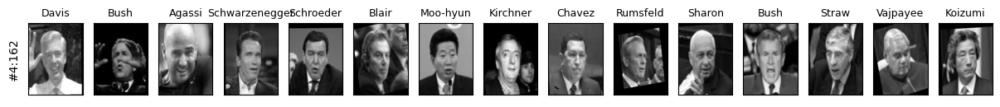

...

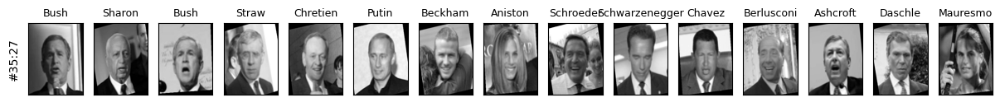

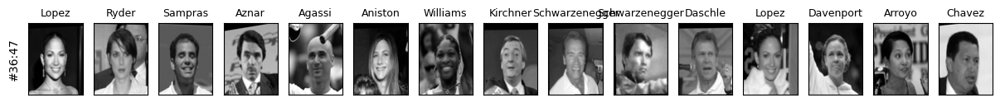

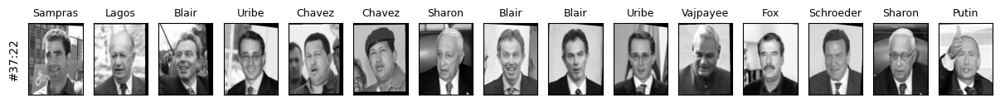

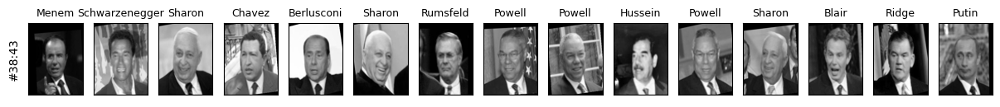

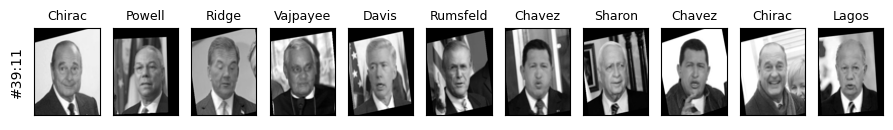

In [73]:
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("Cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(
        1, 15, subplot_kw={"xticks": (), "yticks": ()}, figsize=(15, 8)
    )
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}:{}".format(cluster, cluster_size))
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape), cmap="gray")
        ax.set_title(people.target_names[label].split()[-1], fontdict={"fontsize": 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)